# **Unsupervised Learning Intro: Dimensionality Reduction**

In [1]:
# principales
import numpy as np
import pandas as pd
import os, time, pickle, gzip
import datetime

# data externa
from sklearn.datasets import fetch_openml

# preparacion
from sklearn import preprocessing as pp 

# visualizacion
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

# Cargar data
Para este laboratorio de introduccion trabajaremos con la data [MNIST](https://conx.readthedocs.io/en/latest/MNIST.html), usada anteriormente.

Recordemos que la data MNIST de scikit-learn cargada mediante la funcion `fetch_openml()` viene como un diccionario que incluye metadata:

In [2]:
mnist = fetch_openml('mnist_784', version=1, as_frame=False)
mnist.keys()

dict_keys(['data', 'target', 'frame', 'categories', 'feature_names', 'target_names', 'DESCR', 'details', 'url'])

In [3]:
X = mnist["data"]
y = mnist["target"]
y = y.astype(np.uint8)

In [4]:
X_train = X[:60000]
y_train = y[:60000]
X_validation = X[60000:]
y_validation = y[60000:]

In [5]:
# crear DataFrames de pandas para la data
train_index = range(0,len(X_train))
validation_index = range(len(X_train), len(X_train) + len(X_validation))

X_train = pd.DataFrame(data=X_train,index=train_index)
y_train = pd.Series(data=y_train,index=train_index)

X_validation = pd.DataFrame(data=X_validation,index=validation_index)
y_validation = pd.Series(data=y_validation,index=validation_index)

In [6]:
# revisar labels (target)
y_train.head()

0    5
1    0
2    4
3    1
4    9
dtype: uint8

In [7]:
#  funcion para ver un digito
def ver_digito(ejemplo):
    imagen = X_train.loc[ejemplo,:].values.reshape([28,28])
    plt.imshow(imagen, cmap=mpl.cm.binary)
    plt.axis("off")
    plt.tight_layout()

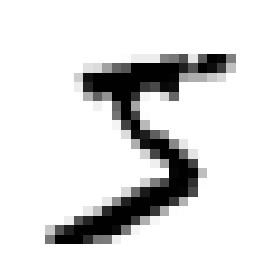

In [8]:
ver_digito(0)

# Principal Components Analysis (PCA)

In [9]:
# Analisis de componentes principales
from sklearn.decomposition import PCA

n_components = 784
whiten = False
random_state = 1844

pca = PCA(n_components=n_components, whiten=whiten, random_state=random_state)

X_train_PCA = pca.fit_transform(X_train)
X_train_PCA = pd.DataFrame(data=X_train_PCA, index=train_index)

Como no hemos reducido la dimensionalidad de la data aun, la informacion capturada por los componentes debe ser del 100%.

In [10]:
# Porcentaje de la varianza capturada por 784 componentes principales
print("Varianza capturada por los 784 componentes: ", sum(pca.explained_variance_ratio_))

Varianza capturada por los 784 componentes:  0.9999999999999988


Que porcentaje de la varianza es capturada por los primeros X componentes?

In [11]:
pc_importance = pd.DataFrame(data=pca.explained_variance_ratio_)
pc_importance = pc_importance.T

print('Varianza capturada por primeros 10  componentes principales: ', pc_importance.loc[:,0:9].sum(axis=1).values)
print('Varianza capturada por primeros 20  componentes principales: ', pc_importance.loc[:,0:19].sum(axis=1).values)
print('Varianza capturada por primeros 50  componentes principales: ', pc_importance.loc[:,0:49].sum(axis=1).values)
print('Varianza capturada por primeros 100 componentes principales: ', pc_importance.loc[:,0:99].sum(axis=1).values)
print('Varianza capturada por primeros 200 componentes principales: ', pc_importance.loc[:,0:199].sum(axis=1).values)
print('Varianza capturada por primeros 300 componentes principales: ', pc_importance.loc[:,0:299].sum(axis=1).values)

Varianza capturada por primeros 10  componentes principales:  [0.4881498]
Varianza capturada por primeros 20  componentes principales:  [0.6435809]
Varianza capturada por primeros 50  componentes principales:  [0.82464686]
Varianza capturada por primeros 100 componentes principales:  [0.91462857]
Varianza capturada por primeros 200 componentes principales:  [0.96644735]
Varianza capturada por primeros 300 componentes principales:  [0.98622875]


Veamos graficamente el aporte individual de cada componente a la varianza explicada:

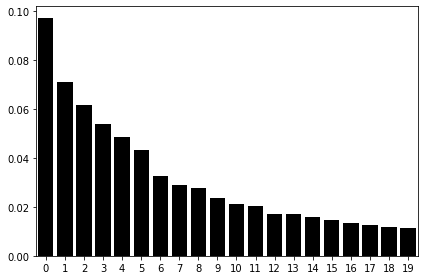

In [12]:
sns.barplot(data=pc_importance.loc[:,0:19],color='k')
plt.tight_layout()

El aporte de cada componente principal adicional es menor.

Para demostrar la potencia del PCA para capturar la varianza (informacion) en la data de manera eficiente y compacta, grafiquemos las observaciones en dos dimensiones.

Haremos un scaterplot de los dos primeros conmponetes y pintaremos los puntos en funcion del digito que realmente representan (*true label*).

In [13]:
# Definir funcion scatterplot
def custom_scatter_plot(x_df, y_df, nombre_algoritmo):
    temp_df = pd.DataFrame(data=x_df.loc[:,0:1], index=x_df.index)
    temp_df = pd.concat((temp_df, y_df), axis=1, join="inner")
    temp_df.columns = ["primer vector", "segundo vector", "label"]
    sns.lmplot(x="primer vector", y="segundo vector", hue="label", data=temp_df, fit_reg=False)

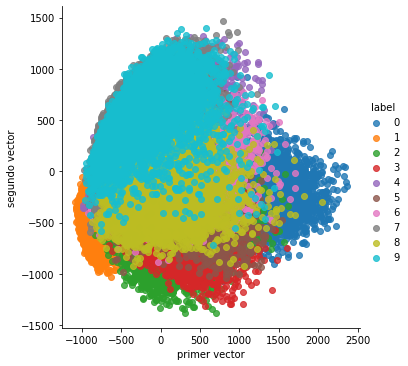

In [14]:
custom_scatter_plot(X_train_PCA, y_train, "PCA")

Como se mostro en el analisis de varianza explicada, los primeros dos componentes principales aportan la mayor informacion y logran separar los puntos en el espacio de manera que digitos iguales tienden a estar relativamente cerca. 

Que pasaria si se utiliza los dos principales features (de los 784 originales) encontrados por un [algoritmo de aprendizaje supervisado](https://bit.ly/3AM6FV7) para discriminar la data: 

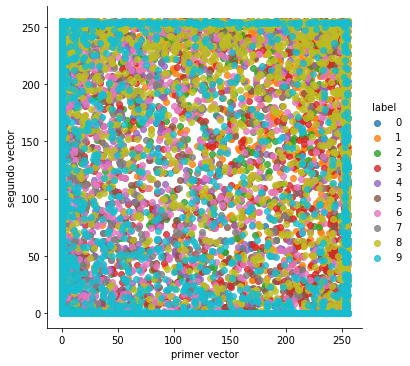

In [15]:
X_train_scatter = pd.DataFrame(data=X_train.loc[:,[350,461]], index=X_train.index)
X_train_scatter = pd.concat((X_train_scatter, y_train), axis=1, join="inner")
X_train_scatter.columns = ["primer vector", "segundo vector", "label"]
sns.lmplot(x="primer vector", y="segundo vector", hue="label", data=X_train_scatter, fit_reg=False)

La separacion es pobre. Esto muestra la potencia del *unsupervised learning* para aprender la estructura subyacente a la data sin utilizar *labels* (*true values*).

Probemos otros algoritmos de reduccion dimensional para aprender la estructura de la data:

# Singular Value Decomposition (SVD)

In [16]:
# Singular Value Decomposition
from sklearn.decomposition import TruncatedSVD

n_components = 200
algorithm = 'randomized'
n_iter = 5
random_state = 1844

svd = TruncatedSVD(n_components=n_components, algorithm=algorithm, n_iter=n_iter, random_state=random_state)

X_train_svd = svd.fit_transform(X_train)
X_train_svd = pd.DataFrame(data=X_train_svd, index=train_index)

X_validation_svd = svd.transform(X_validation)
X_validation_svd = pd.DataFrame(data=X_validation_svd, index=validation_index)

# custom_scatter_plot(X_train_svd, y_train, "Singular Value Decomposition")

# Kernel PCA

In [17]:
from sklearn.decomposition import KernelPCA

n_components = 100
kernel = 'rbf'
gamma = None
random_state = 1844
n_jobs = 1

kernelPCA = KernelPCA(n_components=n_components, kernel=kernel, gamma=gamma, n_jobs=n_jobs, random_state=random_state)

kernelPCA.fit(X_train.loc[:10000,:])
X_train_kernelPCA = kernelPCA.transform(X_train)
X_train_kernelPCA = pd.DataFrame(data=X_train_kernelPCA,index=train_index)

X_validation_kernelPCA = kernelPCA.transform(X_validation)
X_validation_kernelPCA = pd.DataFrame(data=X_validation_kernelPCA, index=validation_index)

# custom_scatter_plot(X_train_kernelPCA, y_train, "Kernel PCA")

# t-SNE

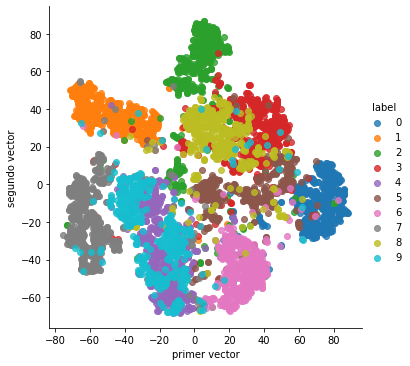

In [18]:
from sklearn.manifold import TSNE

n_components = 2
learning_rate = 300
perplexity = 30
early_exaggeration = 12
init = 'random'
random_state = 1844

tSNE = TSNE(n_components=n_components, learning_rate=learning_rate, perplexity=perplexity, early_exaggeration=early_exaggeration, init=init, random_state=random_state)

X_train_tSNE = tSNE.fit_transform(X_train_PCA.loc[:5000,:9])
X_train_tSNE = pd.DataFrame(data=X_train_tSNE, index=train_index[:5001])

custom_scatter_plot(X_train_tSNE, y_train, "t-SNE")

Este algoritmo, en sus dos primeros compontentes, capturo particularmente bien la inforacion subyacente a nuestra data. En la practica, en el *unsupervised learning* nosotros no conocemos los *true labels* (el valor real del digito), asi que no podriamos saber si un algoritmo es mejor que otro. Lo que si se puede hacer es usar los output de la reduccion dimensional (los "vectores sinteticos" o componentes principales que explican la mayor varianza) en el modelamiento predictivo. Este numero reducido de vectores podria generar ganancias de poder predictivo.